In [1]:
!which python

/Users/liamkirwin/.local/share/virtualenvs/cicada-PMgweW5G/bin/python


In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
from cicada.utils import data
from cicada.utils import models
from cicada.utils import visualisation as viz
from cicada import simulate as sim
# from cicada.simple_agent import SimpleAgent
from cicada.agent import Agent

In [4]:
from kaggle_environments.envs.football.helpers import human_readable_agent
from kaggle_environments import make

In [5]:
import numpy as np
import pandas as pd
from ipywidgets import interact
from copy import deepcopy
from tqdm.notebook import tqdm
import seaborn as sns
import json
import matplotlib.pyplot as plt
import statsmodels.api as sm

In [6]:
import lightgbm as lgb
from lightgbm import LGBMClassifier
from sklearn.model_selection import GridSearchCV

In [7]:
pd.options.display.max_columns = 999
pd.options.display.max_rows = 999

# Single game with diagnostics

In [8]:
# agent = SimpleAgent()
agent = Agent()

# Set up the Environment.
env = make("football", configuration={
    "save_video": True, 
    "scenario_name": "11_vs_11_kaggle",
#     "scenario_name": "academy_counterattack_hard",
#     "scenario_name": "academy_empty_goal", 
    "running_in_notebook": True,
#     "episodeSteps": 1000,
})

trainer = env.train([None, "submission2.py"])
obs = trainer.reset()
while not env.done:
#     import pdb; pdb.set_trace()
    action = agent.action_wrapper(obs)
    obs, reward, done, info = trainer.step(action)

env.render(mode="human", width=800, height=600)

In [9]:
fig = viz.make_figure_widget(20)

In [10]:
@interact(view_step=(0, len(env.steps) - 2))
def interactive_display(view_step=0):
    step = deepcopy(env.steps[view_step])
    log_step = agent.state.log[view_step]
    state = data.State(data.step_to_obs(step))
    fig.update(data=viz.get_traces(state, log_step))
    viz.print_diagnostics(state, log_step)
fig

interactive(children=(IntSlider(value=0, description='view_step', max=3000), Output()), _dom_classes=('widget-…

FigureWidget({
    'data': [{'fillcolor': 'rgba(0,0,0,0)',
              'hoverinfo': 'text',
              'm…

In [11]:
stop

NameError: name 'stop' is not defined

In [ ]:
# viz.filter_log(agent.state.log, type=("SHORT_PASS_ATTEMPT", "NEW_POSSESSION"))

In [ ]:
viz.filter_log(agent.state.log, type=("MOVE_WITH_BALL_ATTEMPT", "LOST_POSSESSION"))

In [12]:
viz.filter_log(agent.state.log, type=("ACTIVE_POS_SCORE"))

[[{'base': {'val': 'nan', 'score': 15},
   'posx': {'val': -0.4266543984413147, 'score': 3.542834346412456},
   'dnet': {'val': 1.4404588615326588, 'score': -4.321376584597976},
   'view': {'val': 0.0, 'score': 0.0},
   'dopp': {'val': 0.1, 'score': 1.0},
   'total': {'val': 'nan', 'score': 15.221457761814479},
   'type': 'ACTIVE_POS_SCORE',
   'step': 0}],
 [{'base': {'val': 'nan', 'score': 15},
   'posx': {'val': 5.596597629775601e-10, 'score': 5.418539924139177},
   'dnet': {'val': 1.0001802569680647, 'score': -3.000540770904194},
   'view': {'val': 0.012786322258642348, 'score': 0.2812990896901317},
   'dopp': {'val': 0.052431573607604635, 'score': 0.5243157360760463},
   'total': {'val': 'nan', 'score': 18.22361397900116},
   'type': 'ACTIVE_POS_SCORE',
   'step': 1}],
 [{'base': {'val': 'nan', 'score': 15},
   'posx': {'val': 1.3691572320340128e-09, 'score': 5.418539927303219},
   'dnet': {'val': 1.0001267611301545, 'score': -3.000380283390464},
   'view': {'val': 0.0, 'score': 0

# Many games

In [13]:
scores = sim.get_score_file_as_df()
scores.shape

(1700, 4)

In [14]:
scores.describe()

,left_score,right_score,win,tie
count,1700.000000,1700.000000,1700.000000,1700.000000
mean,0.986471,0.571765,0.445882,0.361765
std,0.974872,0.774158,0.497209,0.480653
min,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000
50%,1.000000,0.000000,0.000000,0.000000
75%,2.000000,1.000000,1.000000,1.000000
max,6.000000,5.000000,1.000000,1.000000


In [15]:
scores.iloc[800:].describe()

,left_score,right_score,win,tie
count,900.000000,900.000000,900.000000,900.000000
mean,1.095556,0.593333,0.490000,0.321111
std,1.027856,0.799861,0.500178,0.467163
min,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000
50%,1.000000,0.000000,0.000000,0.000000
75%,2.000000,1.000000,1.000000,1.000000
max,6.000000,5.000000,1.000000,1.000000


In [16]:
scores.iloc[1600:].describe()

,left_score,right_score,win,tie
count,100.000000,100.000000,100.000000,100.000000
mean,1.100000,0.650000,0.460000,0.310000
std,0.969223,0.833333,0.500908,0.464823
min,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000
50%,1.000000,0.000000,0.000000,0.000000
75%,2.000000,1.000000,1.000000,1.000000
max,4.000000,4.000000,1.000000,1.000000


## Shot data

In [ ]:
shots = sim.make_kick_dataset("SHOT_ATTEMPT", "GOAL_SCORED")
shots.shape

In [ ]:
shots.head()

In [ ]:
shots.describe()

In [ ]:
shots.groupby(shots["eval_data.dist_to_goalie"].notna()).success.mean()

In [ ]:
shots.success.value_counts()

In [ ]:
for col in [
    "eval_data.view_of_net",
    "eval_data.distance_to_net",
    "eval_data.dist_to_goalie",
#     "eval_data.step",
]:
    f, axes = plt.subplots(1, 2, figsize=(14, 4))
    sns.regplot(x=shots[col], y=shots.success, logistic=False, ax=axes[0])
    sns.regplot(x=shots[col], y=shots.success, x_bins=20, ax=axes[1])
    plt.show()

In [ ]:
sns.regplot(x=shots["eval_data.dist_to_goalie"].clip(lower=0.22), y=shots.success, x_bins=20)

## Short pass data

In [ ]:
short = sim.make_kick_dataset("SHORT_PASS_ATTEMPT", "NEW_POSSESSION")
short.shape

In [ ]:
short.head()

In [ ]:
short.describe()

In [ ]:
short["pos_score_data.view.val"] = short["pos_score_data.view.val"].clip(upper=1)

In [ ]:
short["eval_data.small_cone_angle"] = short["eval_data.small_cone_angle"].clip(upper=40)

In [ ]:
short_pass_cols = [
     "step",
     "pass_error",
     "pass_error_diff",
     "pos_score_data.posx.val",
     "pos_score_data.dnet.val",
     "pos_score_data.view.val",
     "pos_score_data.dopp.val",
     "pos_score_data.total.score",
     "eval_data.pos_offside",
     "eval_data.small_cone_angle",
     "eval_data.pass_distance",
     "eval_data.prb_success",
]
for col in short_pass_cols:
    f, axes = plt.subplots(1, 2, figsize=(10, 4))
    sns.regplot(x=short[col], y=short.success, logistic=False, ax=axes[0])
    sns.regplot(x=short[col], y=short.success, x_bins=20, ax=axes[1])
    plt.show()

In [ ]:
sm.OLS(short.success, sm.add_constant(short[short_pass_cols])).fit().summary()

In [ ]:
short_pass_cols = [
#      "step",
#      "pass_error",
     "pass_error_diff",
     "pos_score_data.posx.val",
     "pos_score_data.dnet.val",
#      "pos_score_data.view.val",
     "pos_score_data.dopp.val",
#      "pos_score_data.total.score",
#      "eval_data.pos_offside",
     "eval_data.small_cone_angle",
     "eval_data.pass_distance",
#      "eval_data.prb_success",
]

In [ ]:
sm.OLS(short.success, sm.add_constant(short[short_pass_cols])).fit().summary()

In [ ]:
model = LGBMClassifier()
grid = {
    "n_estimators": list(range(10, 201, 20)),
    "num_leaves": [10, 30],
}
# neg_log_loss, neg_brier_score, roc_auc, f1
grid_search = GridSearchCV(model, grid, scoring="neg_log_loss", verbose=1, n_jobs=5)
grid_search.fit(short[short_pass_cols], short.success)

In [ ]:
grid_search.best_params_

In [ ]:
sns.displot(grid_search.predict_proba(short[short_pass_cols])[:, 1])

In [ ]:
# pd.DataFrame(grid_search.cv_results_).sort_values("mean_test_score", ascending=False)

In [ ]:
grid_search.best_estimator_.booster_.save_model("short_pass_model.txt")

## Long pass data

In [ ]:
long = sim.make_kick_dataset("LONG_PASS_ATTEMPT", "NEW_POSSESSION")
long.shape

In [ ]:
long.head()

In [ ]:
long.describe()

In [ ]:
long["pos_score_data.view.val"] = long["pos_score_data.view.val"].clip(upper=1)

In [ ]:
long_pass_cols = [
     "step",
     "pass_error",
     "pass_error_diff",
     "pos_score_data.posx.val",
     "pos_score_data.dnet.val",
     "pos_score_data.view.val",
     "pos_score_data.dopp.val",
     "pos_score_data.total.score",
     "eval_data.pos_offside",
     "eval_data.small_cone_angle",
     "eval_data.forward_cone_angle",
     "eval_data.pass_distance",
     "eval_data.prb_success",
]

In [ ]:
for col in long_pass_cols:
    f, axes = plt.subplots(1, 2, figsize=(10, 4))
    sns.regplot(x=long[col], y=long.success, logistic=False, ax=axes[0])
    sns.regplot(x=long[col], y=long.success, x_bins=20, ax=axes[1])
    plt.show()

In [ ]:
sm.OLS(long.success, sm.add_constant(long[long_pass_cols])).fit().summary()

In [ ]:
long_pass_cols = [
#      "step",
#      "pass_error",
     "pass_error_diff",
     "pos_score_data.posx.val",
     "pos_score_data.dnet.val",
#      "pos_score_data.view.val",
     "pos_score_data.dopp.val",
#      "pos_score_data.total.score",
#      "eval_data.pos_offside",
     "eval_data.small_cone_angle",
     "eval_data.forward_cone_angle",
     "eval_data.pass_distance",
#      "eval_data.prb_success",
]

In [ ]:
sm.OLS(long.success, sm.add_constant(long[long_pass_cols])).fit().summary()

In [ ]:
model = LGBMClassifier()
grid = {
    "n_estimators": list(range(10, 101, 10)),
    "num_leaves": [5, 10, 20, 30],
}
# neg_log_loss, neg_brier_score, roc_auc, f1
grid_search = GridSearchCV(model, grid, scoring="neg_log_loss", verbose=1, n_jobs=5)
grid_search.fit(long[long_pass_cols], long.success)

In [ ]:
grid_search.best_params_

In [ ]:
sns.displot(grid_search.predict_proba(long[long_pass_cols])[:, 1])

In [ ]:
# pd.DataFrame(grid_search.cv_results_).sort_values("mean_test_score", ascending=False)

In [ ]:
grid_search.best_estimator_.booster_.save_model("long_pass_model.txt")

## Handling data

In [ ]:
handle = sim.make_handling_dataset()
handle.shape

In [ ]:
handle.head()

In [ ]:
handle.describe()

In [ ]:
handle["pos_score_data.view.val"] = handle["pos_score_data.view.val"].clip(upper=1)

In [ ]:
handle_cols = [
     "step",
     "pos_score_data.posx.val",
     "pos_score_data.dnet.val",
     "pos_score_data.view.val",
     "pos_score_data.dopp.val",
     "pos_score_data.total.score",
     "eval_data.close_opp_dir_change",
     "eval_data.small_cone_angle",
     "eval_data.outside_pitch",
     "eval_data.angle_diff",
     "eval_data.prb_failure",
]

In [ ]:
tmp = handle.sample(30_000)
for col in handle_cols:
    f, axes = plt.subplots(1, 2, figsize=(10, 4))
    sns.regplot(x=tmp[col], y=tmp.failure, logistic=False, ax=axes[0])
    sns.regplot(x=tmp[col], y=tmp.failure, x_bins=20, ax=axes[1])
    plt.show()

In [ ]:
sm.OLS(handle.failure, sm.add_constant(handle[handle_cols])).fit().summary()

In [ ]:
handle_cols = [
#      "step",
     "pos_score_data.posx.val",
     "pos_score_data.dnet.val",
     "pos_score_data.view.val",
     "pos_score_data.dopp.val",
#      "pos_score_data.total.score",
     "eval_data.close_opp_dir_change",
     "eval_data.small_cone_angle",
#      "eval_data.outside_pitch",
     "eval_data.angle_diff",
#      "eval_data.prb_failure",
]

In [ ]:
sm.OLS(handle.failure, sm.add_constant(handle[handle_cols])).fit().summary()

In [ ]:
model = LGBMClassifier()
grid = {
    "n_estimators": list(range(10, 201, 20)),
    "num_leaves": [10, 30],
}
# neg_log_loss, neg_brier_score, roc_auc, f1
grid_search = GridSearchCV(model, grid, scoring="neg_log_loss", verbose=1, n_jobs=5)
grid_search.fit(handle[handle_cols], handle.failure)

In [ ]:
grid_search.best_params_

In [ ]:
sns.displot(grid_search.predict_proba(handle[handle_cols])[:, 1])

In [ ]:
grid_search.best_estimator_.booster_.save_model("handle_model.txt")

## Position score data

In [18]:
pos_score = sim.make_position_score_dataset()
pos_score.shape

100%|██████████| 1710/1710 [00:16<00:00, 101.89it/s]


(9106, 16)

In [51]:
pos_score["pred"] = np.random.uniform(size=len(pos_score))

In [49]:
pos_score.head()

,type,step,reward,game_id,base.val,base.score,posx.val,posx.score,dnet.val,dnet.score,view.val,view.score,dopp.val,dopp.score,total.val,total.score,pred,target
0,ACTIVE_POS_SCORE,13,0,2.020110e+15,nan,15.0,-0.182207,4.671801,1.182213,-3.546640,0.0,0.0,0.1,1.0,nan,17.125161,NaN,NaN
1,ACTIVE_POS_SCORE,14,0,2.020110e+15,nan,15.0,-0.182799,4.669252,1.182814,-3.548441,0.0,0.0,0.1,1.0,nan,17.120811,NaN,NaN
2,ACTIVE_POS_SCORE,15,0,2.020110e+15,nan,15.0,-0.183371,4.666792,1.183398,-3.550195,0.0,0.0,0.1,1.0,nan,17.116598,NaN,NaN
3,ACTIVE_POS_SCORE,16,0,2.020110e+15,nan,15.0,-0.183715,4.665310,1.183764,-3.551291,0.0,0.0,0.1,1.0,nan,17.114019,NaN,NaN
4,ACTIVE_POS_SCORE,17,0,2.020110e+15,nan,15.0,-0.183844,4.664758,1.183923,-3.551769,0.0,0.0,0.1,1.0,nan,17.112989,NaN,NaN


In [24]:
X_cols = ["posx.val", "dnet.val", "view.val", "dopp.val"]

In [50]:
pos_score.isna().mean()

type           0.0
step           0.0
reward         0.0
game_id        0.0
base.val       0.0
base.score     0.0
posx.val       0.0
posx.score     0.0
dnet.val       0.0
dnet.score     0.0
view.val       0.0
view.score     0.0
dopp.val       0.0
dopp.score     0.0
total.val      0.0
total.score    0.0
pred           1.0
target         1.0
dtype: float64

In [92]:
for _ in tqdm(range(1_000)):
    pos_score["target"] = (pos_score.reward * 100.0 + pos_score.pred.shift(-1) * 0.99).clip(lower=0.0, upper=100.0)
    pos_score.loc[pos_score.game_id != pos_score.game_id.shift(1), "target"] = np.nan
    X = sm.add_constant(pos_score[x_cols])
    mask = pos_score.target.notna()
    model = sm.OLS(pos_score.target[mask], X[mask], missing="drop").fit()
    pos_score["pred"] = model.predict(X)

In [93]:
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 target   R-squared:                       0.885
Model:                            OLS   Adj. R-squared:                  0.885
Method:                 Least Squares   F-statistic:                 1.745e+04
Date:                Sun, 01 Nov 2020   Prob (F-statistic):               0.00
Time:                        23:26:26   Log-Likelihood:                -27411.
No. Observations:                9095   AIC:                         5.483e+04
Df Residuals:                    9090   BIC:                         5.487e+04
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        189.7641      1.258    150.905      0.000     187.299     192.229
posx.val    -113.8181      1.108   -102.748      0.000    -115.990    -111.647
dnet.val    -155.3223      1.221   -127.211      0.000    -157.716    -152.929
view.val      22.6487      1.264     17.913      0.000      20.170      25.127
dopp.val      55.4692      1.909     29.064      0.000      51.728      59.210
==============================================================================
Omnibus:                     7554.259   Durbin-Watson:                   0.974
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           954157.823
Skew:                           3.331   Prob(JB):                         0.00
Kurtosis:                      52.734   Cond. No.                         57.1
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

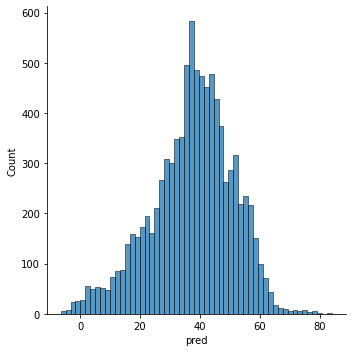

In [94]:
sns.displot(pos_score.pred)

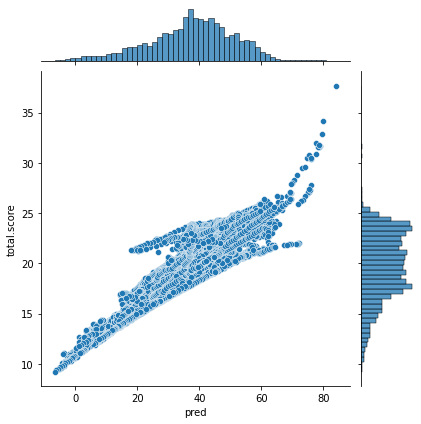

In [95]:
sns.jointplot(x=pos_score.pred, y=pos_score["total.score"])

# Ball physics

In [ ]:
ball_cols = [c for c in df.columns if c.startswith("ball")]
df[[c + "_diff" for c in ball_cols]] = df[ball_cols].diff().shift(-1)
df["ball_in_air"] = df.ball_pos_z > 0.7
df["ball_vel"] = (df.ball_dir_x**2 + df.ball_dir_y**2 + df.ball_dir_z**2) ** 0.5

In [ ]:
df.head()

In [ ]:
df[df.ball_in_air].head(30)

In [ ]:
df.ball_pos_z.plot(figsize=(15, 5))

In [ ]:
ax = df[df.ball_in_air & (df.ball_dir_z != 0.0)].plot.scatter(
    x="ball_dir_z",
    y="ball_pos_z_diff",
#     c="ball_vel",
    figsize=(15, 10),
)
ax.plot([-1, 1], [-1, 1])
ax.set_ylim(-1, 1)
abline(ax, 1, -0.05)

In [ ]:
df[df.ball_in_air & (df.ball_dir_z != 0.0) & (df.ball_dir_z_diff > 1)]
df[(df.step >= 1660) & (df.step <= 1670)]

In [ ]:
ax = df[df.ball_in_air & (df.ball_dir_z != 0.0)].plot.scatter(
    x="ball_dir_z",
    y="ball_dir_z_diff",
#     c="ball_pos_z",
    figsize=(15, 10),
)
ax.plot([-1, 1], [-1, 1])
abline(ax, -0.01, -0.08)

In [ ]:
ax = df[df.ball_in_air & (df.ball_dir_x != 0.0)].plot.scatter(x="ball_dir_x", y="ball_pos_x_diff")
ax.plot([-0.1, 0.1], [-0.1, 0.1])

In [ ]:
ax = df[df.ball_in_air & (df.ball_dir_x != 0.0)].plot.scatter(x="ball_dir_x", y="ball_dir_x_diff")
ax.plot([-0.04, 0.04], [-0.04, 0.04])
abline(ax, -0.05, 0)

In [ ]:
ax = df[df.ball_in_air & (df.ball_dir_y != 0.0)].plot.scatter(x="ball_dir_y", y="ball_dir_y_diff")
ax.plot([-0.01, 0.01], [-0.01, 0.01])
abline(ax, -0.05, 0)

In [ ]:
def abline(ax, slope, intercept):
    x_vals = np.array(ax.get_xlim())
    y_vals = intercept + slope * x_vals
    ax.plot(x_vals, y_vals, '--')

In [ ]:
(df.ball_pos_z_diff - df.ball_dir_z).mean()